In [2]:
import pandas as pd
import geopandas as gpd

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns


In [3]:
business=gpd.read_file("business_poly.gpkg")

Cannot find header.dxf (GDAL_DATA is not defined)


In [4]:
orders=gpd.read_file("order_points_FULL.gpkg")

In [5]:
ppl=gpd.read_file("houses_poly_with_ppl.gpkg")

In [6]:
ppl

,addr:city,addr:street,addr:housenumber,index_right,Порядковый номер,Год постройки,Район,Число этажей,"Площадь жилых помещений, м2",Количество проживающих,Аварийность,address,geometry
0,None,Новое шоссе,6 к1,19151,1942,1966,Курортный,2.0,290.7,17.0,0,"Санкт-Петербург, пос. Белоостров, Новое шоссе,...","MULTIPOLYGON (((334029.825 6671260.333, 334034..."
1,None,Новое шоссе,6 к2,9175,15385,1958,Курортный,2.0,412.3,29.0,0,"Санкт-Петербург, пос. Белоостров, Новое шоссе,...","MULTIPOLYGON (((334059.345 6671246.517, 334063..."
2,None,None,None,9174,14098,1952,Курортный,4.0,2601.9,143.0,0,"Санкт-Петербург, пос. Белоостров, Новое шоссе,...","MULTIPOLYGON (((333850.511 6671297.030, 333852..."
3,None,Новое шоссе,4,19150,9833,1958,Курортный,2.0,464.2,32.0,0,"Санкт-Петербург, пос. Белоостров, Новое шоссе,...","MULTIPOLYGON (((333991.326 6671277.032, 333996..."
4,Репино,Приморское шоссе,394 к4,609,17428,1967,Курортный,3.0,516.3,NaN,0,"Санкт-Петербург, пос. Репино, Приморское шоссе...","MULTIPOLYGON (((327283.223 6673100.305, 327304..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22140,None,улица Маяковского,3А,10232,22678,1900,Центральный,6.0,5920.0,159.0,0,"Санкт-Петербург, Маяковского ул, дом 3, литера А","MULTIPOLYGON (((352271.503 6646951.400, 352237..."
22141,None,Гороховая улица,19 литБ,7551,8827,1917,Адмиралтейский,3.0,1479.9,38.0,0,"Санкт-Петербург, Гороховая ул, дом 19, литера Б","MULTIPOLYGON (((350022.364 6646802.451, 350025..."
22142,None,Транспортный переулок,6 литБ,1190,17063,1883,Центральный,4.0,779.0,41.0,0,"Санкт-Петербург, Транспортный пер, дом 6, лите...","MULTIPOLYGON (((352381.501 6645517.446, 352410..."
22143,None,Транспортный переулок,6,20298,22544,1905,Центральный,6.0,1705.2,83.0,0,"Санкт-Петербург, Транспортный пер, дом 6, лите...","MULTIPOLYGON (((352410.868 6645506.485, 352413..."


In [7]:
business=business.drop(['index_right'], axis=1)

In [8]:
business_orders=gpd.sjoin(business, orders, how='left', predicate='contains')

In [9]:
business_orders['id']=business_orders.index

In [10]:
business_orders=business_orders[~business_orders.workday.isna()]

In [11]:
aa=business_orders[['id', 'order_sum']].groupby('id').mean().rename(columns={"order_sum": "Средний чек"})
aa

,Средний чек
id,
0,1335.931463
2,898.566190
3,701.816667
6,1248.000000
13,1555.229231
...,...
847,594.505000
848,984.299821
849,963.640098


In [12]:
bb=business_orders[['id', 'order_sum']].groupby('id').sum().rename(columns={"order_sum": "Общая сумма заказов"})
bb

,Общая сумма заказов
id,
0,54773.19
2,37739.78
3,12632.70
6,1248.00
13,20217.98
...,...
847,4756.04
848,55120.79
849,98291.29


In [13]:
cc=business_orders[['id', 'order_sum']].groupby('id').count().rename(columns={"order_sum": "Количество заказов"})
cc

,Количество заказов
id,
0,41
2,42
3,18
6,1
13,13
...,...
847,8
848,56
849,102


In [14]:
business_orders.workday=business_orders.workday.astype('int')

In [15]:
dd=business_orders[['id', 'workday']].groupby('id').mean().rename(columns={"workday": "Доля заказов"})
dd

,Доля заказов
id,
0,0.975610
2,0.976190
3,1.000000
6,1.000000
13,1.000000
...,...
847,1.000000
848,1.000000
849,0.774510


In [16]:
ss=pd.concat([aa, bb, cc, dd], axis=1)

In [17]:
business1=ss.join(business[['Наименование', 'Описание', 'Адрес', '2GIS URL', 'geometry']], how='left')

In [18]:
business1=gpd.GeoDataFrame(business1, geometry='geometry')

In [19]:
business1

,Средний чек,Общая сумма заказов,Количество заказов,Доля заказов,Наименование,Описание,Адрес,2GIS URL,geometry
id,,,,,,,,,
0,1335.931463,54773.19,41,0.975610,Дитрих Дизайн,бизнес-центр,"5-й Верхний переулок, 15",https://2gis.com/firm/70000001048487342,"MULTIPOLYGON (((353193.407 6662410.612, 353190..."
2,898.566190,37739.78,42,0.976190,Парнас,бизнес-центр,"6-й Верхний переулок, 12 лит А",https://2gis.com/firm/5348553838585016,"MULTIPOLYGON (((352800.923 6662850.674, 352799..."
3,701.816667,12632.70,18,1.000000,Парнас,бизнес-центр,"Домостроительная, 4 лит А",https://2gis.com/firm/5348552838525781,"MULTIPOLYGON (((353184.807 6661014.703, 353198..."
6,1248.000000,1248.00,1,1.000000,Севастьяновский,бизнес-центр,"Севастьянова, 12",https://2gis.com/firm/70000001027520023,"MULTIPOLYGON (((365678.911 6626977.790, 365693..."
13,1555.229231,20217.98,13,1.000000,Царскосельский,бизнес-центр,"Глинки, 3",https://2gis.com/firm/5348552839750319,"MULTIPOLYGON (((355244.840 6622599.229, 355245..."
...,...,...,...,...,...,...,...,...,...
847,594.505000,4756.04,8,1.000000,Литера,бизнес-центр,"Галерная, 10",https://2gis.com/firm/5348552838522876,"MULTIPOLYGON (((349096.429 6647204.391, 349087..."
848,984.299821,55120.79,56,1.000000,Коллегия,бизнес-центр,"набережная реки Мойки, 74",https://2gis.com/firm/70000001039818360,"MULTIPOLYGON (((349448.411 6646728.393, 349441..."
849,963.640098,98291.29,102,0.774510,Грани,бизнес-центр,"Большая Зеленина, 24 лит А",https://2gis.com/firm/70000001041380460,"MULTIPOLYGON (((348493.792 6650385.978, 348487..."


In [20]:
ppl=ppl.drop(['index_right'], axis=1)

In [21]:
ppl_orders=gpd.sjoin(ppl, orders, how='left', predicate='contains')

In [22]:
ppl_orders=ppl_orders[ppl_orders['order_sum']>0]

In [23]:
ppl_orders

,addr:city,addr:street,addr:housenumber,Порядковый номер,Год постройки,Район,Число этажей,"Площадь жилых помещений, м2",Количество проживающих,Аварийность,...,service,order_sum,Время_взятия_на_сборку,Время_сборки,Время_взятия_в_доставку,Время_доставки,Вид курьера,day,workday,neighbourhood
5,Репино,Приморское шоссе,423 к1,4854,1971,Курортный,5.0,4175.3,NaN,0,...,Доставка за 4 часа ...,38.00,NaN,NaN,NaN,67.0,Авто,01,0,Репино
5,Репино,Приморское шоссе,423 к1,4854,1971,Курортный,5.0,4175.3,NaN,0,...,Доставка за 4 часа ...,923.78,NaN,NaN,NaN,67.0,Авто,01,0,Репино
5,Репино,Приморское шоссе,423 к1,4854,1971,Курортный,5.0,4175.3,NaN,0,...,Доставка за 4 часа ...,1201.32,NaN,NaN,NaN,60.0,Авто,12,0,Репино
5,Репино,Приморское шоссе,423 к1,4854,1971,Курортный,5.0,4175.3,NaN,0,...,Доставка за 4 часа ...,1474.00,NaN,NaN,NaN,67.0,Авто,01,0,Репино
5,Репино,Приморское шоссе,423 к1,4854,1971,Курортный,5.0,4175.3,NaN,0,...,Доставка за 4 часа ...,1101.92,4.0,3.0,6.0,81.0,Авто,21,1,Репино
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22143,None,Транспортный переулок,6,22544,1905,Центральный,6.0,1705.2,83.0,0,...,Доставка за 1 час ...,519.00,1.0,6.0,1.0,19.0,Вело,25,1,округ Лиговка-Ямская
22143,None,Транспортный переулок,6,22544,1905,Центральный,6.0,1705.2,83.0,0,...,Доставка за 1 час ...,651.50,1.0,5.0,3.0,15.0,Ночной авто курьер,24,1,округ Лиговка-Ямская
22143,None,Транспортный переулок,6,22544,1905,Центральный,6.0,1705.2,83.0,0,...,Доставка за 1 час ...,456.00,1.0,10.0,2.0,12.0,Вело,04,1,округ Лиговка-Ямская
22143,None,Транспортный переулок,6,22544,1905,Центральный,6.0,1705.2,83.0,0,...,Доставка за 1 час ...,500.00,0.0,7.0,1.0,24.0,Ночной Вело Курьер,26,1,округ Лиговка-Ямская


In [24]:
ppl_orders['id']=ppl_orders.index

In [25]:
aa=ppl_orders[['id', 'order_sum']].groupby('id').mean().rename(columns={"order_sum": "Средний чек"})
aa

,Средний чек
id,
5,974.550000
6,1317.301250
22,994.327143
23,4091.065000
24,2463.796250
...,...
22135,914.594800
22138,1951.710909
22139,1672.930250


In [26]:
bb=ppl_orders[['id', 'order_sum']].groupby('id').sum().rename(columns={"order_sum": "Общая сумма заказов"})
bb

,Общая сумма заказов
id,
5,5847.30
6,10538.41
22,6960.29
23,16364.26
24,19710.37
...,...
22135,22864.87
22138,64406.46
22139,133834.42


In [27]:
cc=ppl_orders[['id', 'order_sum']].groupby('id').count().rename(columns={"order_sum": "Количество заказов"})
cc

,Количество заказов
id,
5,6
6,8
22,7
23,4
24,8
...,...
22135,25
22138,33
22139,80


In [28]:
ppl_orders.workday=ppl_orders.workday.astype('int')

In [29]:
dd=ppl_orders[['id', 'workday']].groupby('id').mean().rename(columns={"workday": "Доля заказов в будни"})
dd

,Доля заказов в будни
id,
5,0.333333
6,0.125000
22,0.571429
23,0.250000
24,0.875000
...,...
22135,0.800000
22138,0.666667
22139,0.587500


In [30]:
ss=pd.concat([aa, bb, cc, dd], axis=1)

In [31]:
ppl1=ss.join(ppl[['Порядковый номер', 'Год постройки', 'Район', 'Число этажей', 'Площадь жилых помещений, м2', 'Количество проживающих', 'Аварийность', 'geometry']], how='left')

In [32]:
ppl1=gpd.GeoDataFrame(ppl1, geometry='geometry')

In [33]:
ppl1=ppl1[ppl1['Количество проживающих']>0]

In [34]:
ppl1['Количество заказов на человека']=ppl1['Количество заказов']/ppl1['Количество проживающих']

In [35]:
ppl1[ppl1['Количество заказов на человека']>0.2].explore()

In [36]:
ppl2=ppl1[['Средний чек', 'Общая сумма заказов', 'Количество заказов', 'Доля заказов в будни', 'geometry']]

In [37]:
business2=business1[['Средний чек', 'Общая сумма заказов', 'Количество заказов', 'Доля заказов', 'geometry']]

In [38]:
business2=business2.rename(columns={'Доля заказов': 'Доля заказов в будни'})

In [39]:
business2['type']='business'

In [40]:
business2=business2[(business2['Доля заказов в будни']>0.75)]

In [41]:
ppl2['type']='residential'

C:\ProgramData\anaconda3\envs\spatial_analysis_course\Lib\site-packages\geopandas\geodataframe.py:1525: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [42]:
business_and_residential=pd.concat([ppl2, business2], axis=0)#.to_file("business_and_residential.gpkg")

In [43]:
business_and_residential

,Средний чек,Общая сумма заказов,Количество заказов,Доля заказов в будни,geometry,type
id,,,,,,
6,1317.301250,10538.41,8,0.125000,"MULTIPOLYGON (((326966.071 6674087.020, 327014...",residential
22,994.327143,6960.29,7,0.571429,"MULTIPOLYGON (((329281.490 6673072.313, 329286...",residential
23,4091.065000,16364.26,4,0.250000,"MULTIPOLYGON (((329415.442 6673146.809, 329421...",residential
24,2463.796250,19710.37,8,0.875000,"MULTIPOLYGON (((329319.910 6673089.393, 329347...",residential
26,4579.143333,27474.86,6,0.666667,"MULTIPOLYGON (((329348.399 6673115.380, 329351...",residential
...,...,...,...,...,...,...
847,594.505000,4756.04,8,1.000000,"MULTIPOLYGON (((349096.429 6647204.391, 349087...",business
848,984.299821,55120.79,56,1.000000,"MULTIPOLYGON (((349448.411 6646728.393, 349441...",business
849,963.640098,98291.29,102,0.774510,"MULTIPOLYGON (((348493.792 6650385.978, 348487...",business


In [44]:
neighb=gpd.read_file("neighbourhoods_full.gpkg")

In [45]:
neighb[['name', 'geometry']]

,name,geometry
0,Агалатовское сельское поселение,"MULTIPOLYGON (((342489.889 6680408.048, 342488..."
1,Адмиралтейский округ,"MULTIPOLYGON (((349550.735 6646279.139, 349413..."
2,Александровская,"MULTIPOLYGON (((348854.044 6624535.280, 349131..."
3,Александровский округ,"MULTIPOLYGON (((355664.985 6634904.614, 356474..."
4,Аннинское городское поселение,"MULTIPOLYGON (((335992.821 6634454.095, 335960..."
...,...,...
171,округ № 54,"MULTIPOLYGON (((358746.221 6642110.127, 358558..."
172,округ № 65,"MULTIPOLYGON (((343386.297 6652639.897, 343401..."
173,округ № 7,"MULTIPOLYGON (((346674.212 6647520.123, 346813..."
174,округ № 72,"MULTIPOLYGON (((353961.118 6638590.520, 353793..."


In [46]:
business_and_residential_with_neigh=gpd.sjoin(business_and_residential, neighb[['name', 'geometry']], how='left', predicate='within')

In [47]:
brdf=business_and_residential_with_neigh.drop(['geometry', 'index_right'], axis=1)

In [48]:
brdf=brdf[brdf['Количество заказов']>10]

In [49]:
neighb_over_7_business=brdf[brdf['type']=='business']['name'].value_counts()[:15]#.index

In [50]:
neighb_over_7_business

name
округ Сампсониевское        19
округ Московская застава    18
округ Смольнинское          16
округ Невская застава       15
округ Волковское            11
Финляндский округ           10
округ Малая Охта            10
Владимирский округ           9
Дворцовый округ              8
округ Звёздное               8
Посадский округ              8
округ Измайловское           8
округ Новоизмайловское       8
округ Аптекарский остров     7
Васильевский округ           7
Name: count, dtype: int64

In [51]:
neighb_average_sum=pd.pivot_table(brdf, values='Средний чек', index='name', columns='type', aggfunc='mean')

In [52]:
neighb_total=pd.pivot_table(brdf, values='Количество заказов', index='name', columns='type', aggfunc='mean')

In [53]:
neighb_average_sum['res_to_biz']=neighb_average_sum.residential/neighb_average_sum.business

In [54]:
neighb_average_sum[neighb_average_sum.index.isin(neighb_over_7_business.index)]

type,business,residential,res_to_biz
name,,,
Васильевский округ,821.507909,1357.023364,1.651869
Владимирский округ,898.504658,1213.711274,1.350812
Дворцовый округ,1100.354673,1543.670325,1.402884
Посадский округ,1157.787694,1541.375002,1.331311
Финляндский округ,960.112450,1184.351844,1.233555
округ Аптекарский остров,964.448082,1535.500571,1.592103
округ Волковское,811.212019,1277.964181,1.575376
округ Звёздное,940.281718,1348.350881,1.433986
округ Измайловское,811.310135,1181.417876,1.456185


In [55]:
neighb_total['res_to_biz']=neighb_total.residential/neighb_total.business

In [56]:
neighb_total[neighb_total.index.isin(neighb_over_7_business.index)]

type,business,residential,res_to_biz
name,,,
Васильевский округ,22.428571,32.142857,1.433121
Владимирский округ,43.111111,29.842324,0.692219
Дворцовый округ,21.000000,27.866667,1.326984
Посадский округ,31.750000,29.000000,0.913386
Финляндский округ,34.600000,27.720930,0.801183
округ Аптекарский остров,21.142857,29.322034,1.386853
округ Волковское,34.272727,26.711111,0.779369
округ Звёздное,61.125000,43.848485,0.717358
округ Измайловское,23.250000,35.528571,1.528111


In [58]:
neighb_average_sum['name']=neighb_average_sum.index

In [59]:
neighb_average_sum

type,business,residential,res_to_biz,name
name,,,,
Адмиралтейский округ,1911.427876,1382.269456,0.723161,Адмиралтейский округ
Александровский округ,703.271429,1239.312729,1.762211,Александровский округ
Балканский округ,871.770000,1223.044749,1.402944,Балканский округ
Васильевский округ,821.507909,1357.023364,1.651869,Васильевский округ
Введенский округ,966.921020,1415.275365,1.463693,Введенский округ
...,...,...,...,...
округ № 54,NaN,1321.866711,NaN,округ № 54
округ № 65,1747.552436,1350.823334,0.772980,округ № 65
округ № 7,1104.788797,1340.892564,1.213709,округ № 7


In [60]:
neighb

,name,Средний чек,Количество заказов,Среднее время доставки,Доля заказов в будни,Общая сумма заказов,geometry
0,Агалатовское сельское поселение,2310.736667,1203,134.788462,0.6093100581878637,2779816.21,"MULTIPOLYGON (((342489.889 6680408.048, 342488..."
1,Адмиралтейский округ,1307.813576,5487,43.896678,0.6686714051394205,7175973.09,"MULTIPOLYGON (((349550.735 6646279.139, 349413..."
2,Александровская,2042.374857,1540,60.504098,0.6214285714285714,3145257.28,"MULTIPOLYGON (((348854.044 6624535.280, 349131..."
3,Александровский округ,1262.952060,11123,32.720954,0.6495549761754922,14047815.76,"MULTIPOLYGON (((355664.985 6634904.614, 356474..."
4,Аннинское городское поселение,1955.319462,651,127.951378,0.6451612903225806,1272912.97,"MULTIPOLYGON (((335992.821 6634454.095, 335960..."
...,...,...,...,...,...,...,...
171,округ № 54,1271.343880,5448,60.411990,0.6348798826334128,6926281.46,"MULTIPOLYGON (((358746.221 6642110.127, 358558..."
172,округ № 65,1375.384053,32875,33.358693,0.6269768856447688,45215750.74,"MULTIPOLYGON (((343386.297 6652639.897, 343401..."
173,округ № 7,1347.078279,6066,37.485612,0.673260797889878,8171376.84,"MULTIPOLYGON (((346674.212 6647520.123, 346813..."
174,округ № 72,1276.776853,5059,36.944251,0.6161296698952362,6459214.10,"MULTIPOLYGON (((353961.118 6638590.520, 353793..."


In [3]:
import matplotlib
import numpy as np
import matplotlib.pyplot as plt

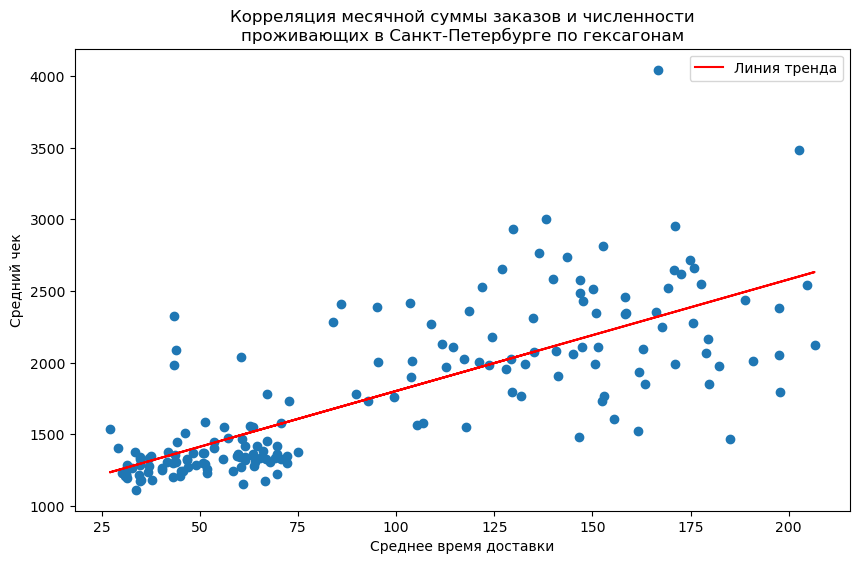

In [64]:
x=neighb['Среднее время доставки']
y=neighb['Средний чек']

plt.figure(figsize=(10, 6))
plt.scatter(x, y)
z = np.polyfit (x, y, 1)
p = np.poly1d (z)
plt.plot(x, p(x), color='red', label='Линия тренда')

# Добавление подписей
plt.xlabel('Среднее время доставки. мин')
plt.ylabel('Средний чек, руб')
plt.title('Корреляция месячной суммы заказов и численности\nпроживающих в Санкт-Петербурге по гексагонам')

# Отображение легенды
plt.legend()

# Отображение графика
plt.show()

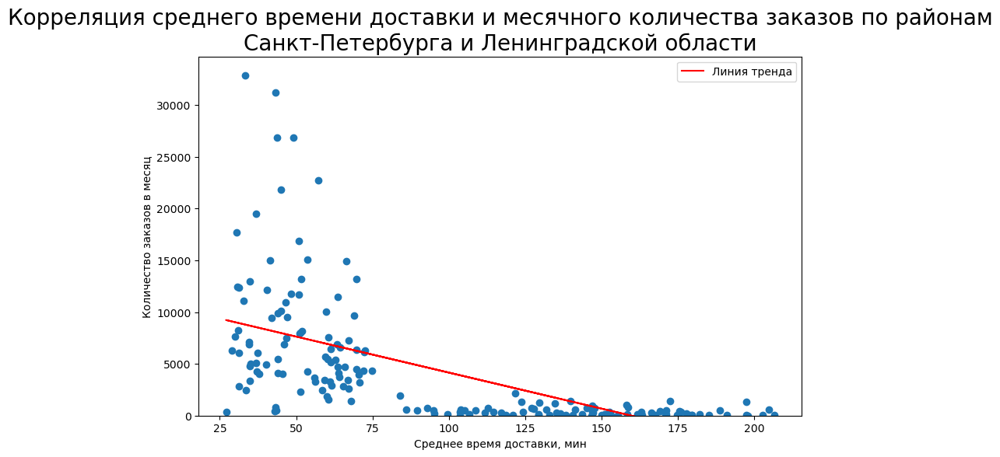

In [68]:
x=neighb['Среднее время доставки']
y=neighb['Количество заказов']

plt.figure(figsize=(10, 6))
plt.scatter(x, y)
z = np.polyfit (x, y, 1)
p = np.poly1d (z)
plt.plot(x, p(x), color='red', label='Линия тренда')

# Ограничение для оси Y
plt.ylim(bottom=0)


# Добавление подписей
plt.xlabel('Среднее время доставки, мин')
plt.ylabel('Количество заказов в месяц')
plt.title('Корреляция среднего времени доставки и месячного количества заказов по районам\nСанкт-Петербурга и Ленинградской области', fontsize=20)

# Отображение легенды
plt.legend()

# Отображение графика
plt.show()

In [89]:
neighb

,name,Средний чек,Количество заказов,Среднее время доставки,Доля заказов в будни,Общая сумма заказов,geometry
0,Агалатовское сельское поселение,2310.736667,1203,134.788462,0.6093100581878637,2779816.21,"MULTIPOLYGON (((342489.889 6680408.048, 342488..."
1,Адмиралтейский округ,1307.813576,5487,43.896678,0.6686714051394205,7175973.09,"MULTIPOLYGON (((349550.735 6646279.139, 349413..."
2,Александровская,2042.374857,1540,60.504098,0.6214285714285714,3145257.28,"MULTIPOLYGON (((348854.044 6624535.280, 349131..."
3,Александровский округ,1262.952060,11123,32.720954,0.6495549761754922,14047815.76,"MULTIPOLYGON (((355664.985 6634904.614, 356474..."
4,Аннинское городское поселение,1955.319462,651,127.951378,0.6451612903225806,1272912.97,"MULTIPOLYGON (((335992.821 6634454.095, 335960..."
...,...,...,...,...,...,...,...
171,округ № 54,1271.343880,5448,60.411990,0.6348798826334128,6926281.46,"MULTIPOLYGON (((358746.221 6642110.127, 358558..."
172,округ № 65,1375.384053,32875,33.358693,0.6269768856447688,45215750.74,"MULTIPOLYGON (((343386.297 6652639.897, 343401..."
173,округ № 7,1347.078279,6066,37.485612,0.673260797889878,8171376.84,"MULTIPOLYGON (((346674.212 6647520.123, 346813..."
174,округ № 72,1276.776853,5059,36.944251,0.6161296698952362,6459214.10,"MULTIPOLYGON (((353961.118 6638590.520, 353793..."


In [69]:
business1[business1['Количество заказов']>30].to_file('offices_over_30_orders.gpkg')

In [70]:
ppl1['rub_per_person']=ppl1['Общая сумма заказов']/ppl1['Количество проживающих']

In [71]:
ppl1[ppl1['Количество заказов']>15]

,Средний чек,Общая сумма заказов,Количество заказов,Доля заказов в будни,Порядковый номер,Год постройки,Район,Число этажей,"Площадь жилых помещений, м2",Количество проживающих,Аварийность,geometry,Количество заказов на человека,rub_per_person
id,,,,,,,,,,,,,,
27,1678.930625,26862.89,16,0.625000,11141,2009,Курортный,3.0,1775.10,7.0,0,"MULTIPOLYGON (((329200.706 6673015.217, 329208...",2.285714,3837.555714
235,1319.843846,51473.91,39,0.641026,2813,1996,Московский,5.0,8537.00,367.0,0,"MULTIPOLYGON (((349062.460 6626708.934, 349065...",0.106267,140.255886
242,2005.048333,48121.16,24,0.583333,21827,1992,Пушкинский,5.0,3576.10,172.0,0,"MULTIPOLYGON (((345554.807 6617760.072, 345550...",0.139535,279.774186
313,1537.703200,38442.58,25,0.520000,20198,2011,Красносельский,9.0,8423.20,367.0,0,"MULTIPOLYGON (((335815.327 6626543.976, 335717...",0.068120,104.748174
377,1276.916563,163445.32,128,0.562500,16597,2007,Выборгский,16.0,32154.10,2296.0,0,"MULTIPOLYGON (((350176.170 6661092.236, 350184...",0.055749,71.186986
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22133,535.318696,12312.33,23,0.434783,19063,1917,Центральный,4.0,4546.71,156.0,0,"MULTIPOLYGON (((353073.838 6646321.961, 353085...",0.147436,78.925192
22134,1383.643750,55345.75,40,0.550000,876,2004,Невский,17.0,16559.30,584.0,0,"MULTIPOLYGON (((359487.816 6642037.281, 359493...",0.068493,94.770120
22135,914.594800,22864.87,25,0.800000,4089,1879,Центральный,5.0,9126.10,286.0,0,"MULTIPOLYGON (((351563.349 6646295.697, 351562...",0.087413,79.947098


In [72]:
ppl1['Год постройки'].value_counts()[:100]

Год постройки
1917    491
1961    416
1964    401
1962    400
1963    368
       ... 
1873     45
1874     44
1897     43
1878     43
1939     42
Name: count, Length: 100, dtype: int64

In [73]:
orders_per_person_by_year=pd.pivot_table(ppl1[ppl1['Количество заказов']>15], values='Количество заказов на человека', index='Год постройки', aggfunc='mean')

In [74]:
orders_per_person_by_year.sort_values(by='Количество заказов на человека')

,Количество заказов на человека
Год постройки,
1892,0.049275
1983,0.056154
1981,0.060619
1984,0.060867
1977,0.065585
...,...
1935,1.760417
2018,1.865965
2020,2.259193


In [75]:
orders_per_person_by_year.loc[1970:]['Количество заказов на человека']

Год постройки
1970    0.084568
1971    0.076368
1972    0.098124
1973    0.081029
1974    0.068908
1975    0.074924
1976    0.065710
1977    0.065585
1978    0.115924
1979    0.095143
1980    0.069611
1981    0.060619
1982    0.070590
1983    0.056154
1984    0.060867
1985    0.102675
1986    0.112675
1987    0.126569
1988    0.121348
1989    0.090683
1990    0.090453
1991    0.078141
1992    0.100797
1993    0.114656
1994    0.106584
1995    0.107425
1996    0.128997
1997    0.151527
1998    0.157186
1999    0.374556
2000    0.200422
2001    0.305397
2002    0.293669
2003    0.494128
2004    0.217051
2005    0.234697
2006    0.467936
2007    0.442540
2008    0.419237
2009    0.845225
2010    1.113093
2011    0.424604
2012    0.383670
2013    1.448724
2014    0.621148
2015    0.776608
2016    0.743978
2017    1.330539
2018    1.865965
2019    7.519654
2020    2.259193
Name: Количество заказов на человека, dtype: float64

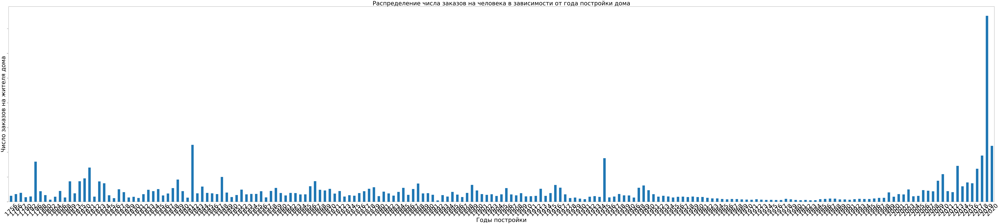

In [76]:


# Создание столбчатой диаграммы с использованием matplotlib
plt.figure(figsize=(150, 30))
orders_per_person_by_year['Количество заказов на человека'].plot(kind='bar')
plt.title('Распределение числа заказов на человека в зависимости от года постройки дома', fontsize=50)
plt.xlabel('Годы постройки', fontsize=50)
plt.ylabel('Число заказов на жителя дома', fontsize=50)
plt.xticks(rotation=45, fontsize=50)
plt.show()



In [77]:
order_sum_per_person_by_year=pd.pivot_table(ppl1[ppl1['Количество заказов']>15], values='rub_per_person', index='Год постройки', aggfunc='mean')

In [78]:
order_sum_per_person_by_year

,rub_per_person
Год постройки,
1756,219.963765
1766,278.067805
1777,592.916374
1790,180.752613
1792,260.909948
...,...
2016,980.457893
2017,1780.972328
2018,2588.291053


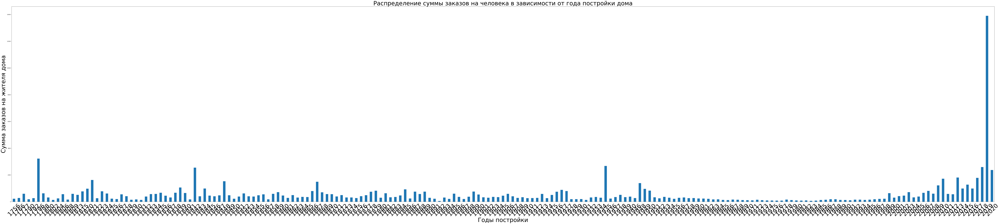

In [79]:
# Создание столбчатой диаграммы с использованием matplotlib
plt.figure(figsize=(150, 30))
order_sum_per_person_by_year['rub_per_person'].plot(kind='bar')
plt.title('Распределение суммы заказов на человека в зависимости от года постройки дома', fontsize=50)
plt.xlabel('Годы постройки', fontsize=50)
plt.ylabel('Сумма заказов на жителя дома', fontsize=50)
plt.xticks(rotation=45, fontsize=50)
plt.show()


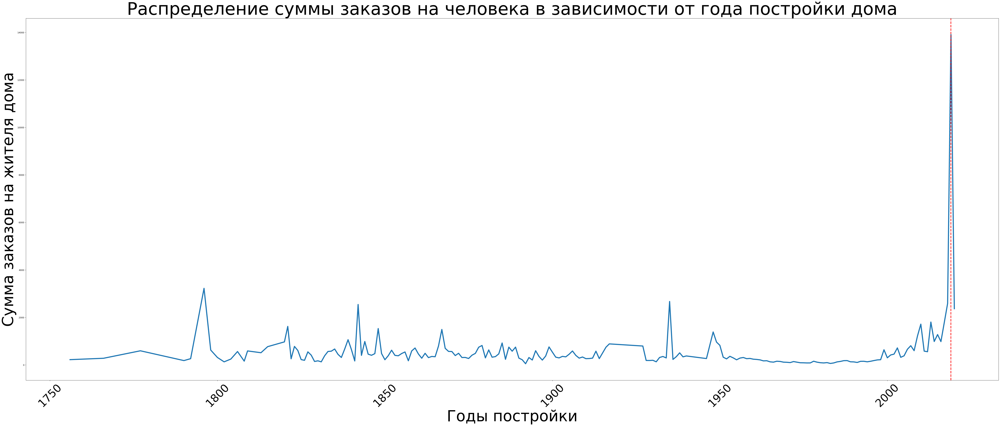

In [88]:
plt.figure(figsize=(80, 30))

# Построение линейного графика с более толстой линией
order_sum_per_person_by_year['rub_per_person'].plot(kind='line', linewidth=5)

# Добавление заголовков и подписей осей
plt.title('Распределение суммы заказов на человека в зависимости от года постройки дома', fontsize=80)
plt.xlabel('Годы постройки', fontsize=70)
plt.ylabel('Сумма заказов на жителя дома', fontsize=70)

# Вращение меток оси X
plt.xticks(rotation=45, fontsize=50)

# Добавление вертикальной линии на 2019 год и подписи
plt.axvline(x=2019, color='red', linewidth=3, linestyle='--')  # Вертикальная линия
# plt.text(2019, order_sum_per_person_by_year['rub_per_person'].max(), '2019', color='red', fontsize=50, ha='center', va='bottom')

plt.show()


In [90]:
orders

,id_order,date_completed,Широта,Долгота,darkstore_name,service,order_sum,Время_взятия_на_сборку,Время_сборки,Время_взятия_в_доставку,Время_доставки,Вид курьера,day,workday,neighbourhood,geometry
0,300385329,2024-06-01,60.011190,30.386736,5018ДС_СПб_Полюстровский59,Доставка сейчас ...,1786.00,NaN,NaN,NaN,25.0,Авто,01,0,округ Академическое,POINT (354312.689 6655535.756)
1,300519918,2024-06-01,59.906030,30.340778,4756ДС_СПб_Лиговский60,Доставка за 1 час ...,1821.32,NaN,NaN,NaN,30.0,Ночной авто курьер,01,0,округ Волковское,POINT (351280.865 6643932.832)
2,300547519,2024-06-01,59.973000,30.308500,4986ДС_СПб_5яВО70,Доставка сейчас ...,1245.02,NaN,NaN,NaN,3.0,Вело,01,0,округ Аптекарский остров,POINT (349779.635 6651459.914)
3,300568378,2024-06-01,60.213394,29.886294,8109ДС_СПб_Инструментальщиков12,Доставка за 4 часа ...,2073.42,NaN,NaN,NaN,107.0,Авто,01,0,Первомайское сельское поселение,POINT (327487.404 6679246.516)
4,300580192,2024-06-01,59.944041,30.491392,4765ДС_СПб_Союзныйпроспект12,Доставка сейчас ...,4704.30,NaN,NaN,NaN,4.0,Вело,01,0,округ Пороховые,POINT (359861.733 6647835.183)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
777549,304242573,2024-06-10,59.997847,30.203201,4789ДС_СПб_Оптиков30,Доставка за 1 час ...,713.92,1.0,1.0,1.0,29.0,Вело,10,1,округ № 65,POINT (344021.866 6654469.207)
777550,304242575,2024-06-10,59.868818,30.459505,6954ДС_СПб_МалаяБухарестская12,Доставка сейчас ...,1682.00,1.0,NaN,NaN,NaN,None,10,1,Обуховский округ,POINT (357759.574 6639529.938)
777551,304242587,2024-06-10,59.895439,30.327638,4756ДС_СПб_Лиговский60,Доставка сейчас ...,1189.65,3.0,2.0,11.0,99.0,Авто,10,1,округ Московская застава,POINT (350498.661 6642783.584)
777552,304242610,2024-06-10,60.040919,30.217571,4789ДС_СПб_Оптиков30,Доставка сейчас ...,1745.00,0.0,3.0,3.0,47.0,Авто,10,1,округ Коломяги,POINT (345024.785 6659229.415)


In [4]:
ppl=gpd.read_file("final_data_houses/HOUSES_TOTAL.gpkg")

Cannot find header.dxf (GDAL_DATA is not defined)


In [5]:
ppl

,address,year,people,status,geometry
0,"Ленинградская область, р-н. Тосненский, г. Тос...",NaN,21,old,POINT (377671.006 6604714.678)
1,"Ленинградская область, р-н. Тосненский, тер. С...",1962.0,50,old,POINT (370845.598 6606862.730)
2,"Ленинградская область, р-н. Тосненский, тер. С...",1962.0,50,old,POINT (370948.014 6606946.135)
3,"Ленинградская область, р-н. Тосненский, тер. С...",1971.0,124,old,POINT (370828.149 6606901.001)
4,"Ленинградская область, р-н. Тосненский, тер. С...",1971.0,124,old,POINT (370948.014 6606946.135)
...,...,...,...,...,...
28959,"Санкт-Петербург, г. Пушкин, Церковная ул, дом ...",1960.0,41,old,POINT (354390.162 6624025.104)
28960,"Санкт-Петербург, г. Пушкин, Церковная ул, дом ...",1995.0,182,old,POINT (354205.138 6623858.320)
28961,"Санкт-Петербург, г. Пушкин, Церковная ул, дом ...",1917.0,19,old,POINT (353639.697 6623083.410)
28962,"Санкт-Петербург, г. Пушкин, Широкая ул, дом 26...",1953.0,31,old,POINT (355273.687 6623350.379)


In [2]:
import geopandas as gpd
build=gpd.read_file("buildings_spb/BUILDINGS1.gpkg")

Cannot find header.dxf (GDAL_DATA is not defined)


In [3]:
places=['Кудрово', 'Сертолово', 'Бугры', 'Гатчина', 'Мурино', 'Мистолово', 'Кузьмоловский', 'Лаврики', 'Новое Девяткино', 'Всеволожск', 'Янино-1', 'Колтуши', 'имени Свердлова']

In [6]:
import osmnx as ox
import pandas as pd

In [7]:
for place in places:
    buildings=ox.features.features_from_place(f'{place}, Ленинградская область', {'building': True}).to_crs("EPSG:32636")
    build=pd.concat([build, buildings], axis=0)

In [8]:
build=build[['addr:city', 'addr:street', 'geometry']]

In [9]:
build[['']]

,addr:city,addr:street,geometry
0,None,None,"MULTIPOLYGON (((333231.350 6671091.045, 333189..."
1,None,Новое шоссе,"MULTIPOLYGON (((333854.442 6671328.413, 333877..."
2,None,None,"MULTIPOLYGON (((333415.230 6671508.065, 333416..."
3,None,Заречная дорога,"MULTIPOLYGON (((331510.216 6669128.626, 331420..."
4,None,Заречная дорога,"MULTIPOLYGON (((331443.264 6669070.419, 331475..."
...,...,...,...
"(relation, 16376352)",посёлок имени Свердлова,NaN,"POLYGON ((367453.200 6631199.912, 367389.623 6..."
"(relation, 16376356)",посёлок имени Свердлова,NaN,"POLYGON ((367427.216 6631148.664, 367363.638 6..."
"(relation, 16376359)",посёлок имени Свердлова,NaN,"POLYGON ((367258.062 6631042.761, 367260.211 6..."
"(relation, 16376360)",посёлок имени Свердлова,Западный проезд,"POLYGON ((367362.109 6631063.090, 367360.956 6..."


In [19]:
build[['geometry']].to_file("ZASTROYKAAAA.gpkg")

In [15]:
build=build.reset_index()

In [16]:
build

,index,addr:city,addr:street,geometry
0,0,None,None,"MULTIPOLYGON (((333231.350 6671091.045, 333189..."
1,1,None,Новое шоссе,"MULTIPOLYGON (((333854.442 6671328.413, 333877..."
2,2,None,None,"MULTIPOLYGON (((333415.230 6671508.065, 333416..."
3,3,None,Заречная дорога,"MULTIPOLYGON (((331510.216 6669128.626, 331420..."
4,4,None,Заречная дорога,"MULTIPOLYGON (((331443.264 6669070.419, 331475..."
...,...,...,...,...
187908,"(relation, 16376352)",посёлок имени Свердлова,NaN,"POLYGON ((367453.200 6631199.912, 367389.623 6..."
187909,"(relation, 16376356)",посёлок имени Свердлова,NaN,"POLYGON ((367427.216 6631148.664, 367363.638 6..."
187910,"(relation, 16376359)",посёлок имени Свердлова,NaN,"POLYGON ((367258.062 6631042.761, 367260.211 6..."
187911,"(relation, 16376360)",посёлок имени Свердлова,Западный проезд,"POLYGON ((367362.109 6631063.090, 367360.956 6..."


In [13]:
ppl['house_id']=ppl.index

In [14]:
build_with_ppl=build.sjoin(ppl, how='inner', predicate='contains')

In [15]:
build_with_ppl

,addr:city,addr:street,geometry,index_right,address,year,people,status,house_id
13,None,Новое шоссе,"MULTIPOLYGON (((334029.825 6671260.333, 334034...",25013,"Санкт-Петербург, пос. Белоостров, Новое шоссе,...",1966.0,17,old,25013
15,None,Новое шоссе,"MULTIPOLYGON (((334059.345 6671246.517, 334063...",15106,"Санкт-Петербург, пос. Белоостров, Новое шоссе,...",1958.0,29,old,15106
17,None,None,"MULTIPOLYGON (((333850.511 6671297.030, 333852...",15105,"Санкт-Петербург, пос. Белоостров, Новое шоссе,...",1952.0,143,old,15105
19,None,Новое шоссе,"MULTIPOLYGON (((333991.326 6671277.032, 333996...",25012,"Санкт-Петербург, пос. Белоостров, Новое шоссе,...",1958.0,32,old,25012
58,Репино,Приморское шоссе,"MULTIPOLYGON (((327283.223 6673100.305, 327304...",6593,"Санкт-Петербург, пос. Репино, Приморское шоссе...",1967.0,22,old,6593
...,...,...,...,...,...,...,...,...,...
"(relation, 16376344)",посёлок имени Свердлова,NaN,"MULTIPOLYGON (((367422.230 6631320.378, 367417...",3375,"Ленинградская область, р-н. Всеволожский, гп. ...",1992.0,484,old,3375
"(relation, 16376348)",посёлок имени Свердлова,NaN,"POLYGON ((367496.135 6631260.152, 367495.147 6...",3374,"Ленинградская область, р-н. Всеволожский, гп. ...",1983.0,247,old,3374
"(relation, 16376356)",посёлок имени Свердлова,NaN,"POLYGON ((367427.216 6631148.664, 367363.638 6...",3350,"Ленинградская область, р-н. Всеволожский, гп. ...",1987.0,199,old,3350
"(relation, 16376359)",посёлок имени Свердлова,NaN,"POLYGON ((367258.062 6631042.761, 367260.211 6...",3344,"Ленинградская область, р-н. Всеволожский, гп. ...",1986.0,431,old,3344


In [16]:
orders=gpd.read_file("order_points_FULL.gpkg")

In [17]:
orders[['darkstore_name', 'service', 'order_sum', 'Время_доставки', 'workday', 'geometry']]

,darkstore_name,service,order_sum,Время_доставки,workday,geometry
0,5018ДС_СПб_Полюстровский59,Доставка сейчас ...,1786.00,25.0,0,POINT (354312.689 6655535.756)
1,4756ДС_СПб_Лиговский60,Доставка за 1 час ...,1821.32,30.0,0,POINT (351280.865 6643932.832)
2,4986ДС_СПб_5яВО70,Доставка сейчас ...,1245.02,3.0,0,POINT (349779.635 6651459.914)
3,8109ДС_СПб_Инструментальщиков12,Доставка за 4 часа ...,2073.42,107.0,0,POINT (327487.404 6679246.516)
4,4765ДС_СПб_Союзныйпроспект12,Доставка сейчас ...,4704.30,4.0,0,POINT (359861.733 6647835.183)
...,...,...,...,...,...,...
777549,4789ДС_СПб_Оптиков30,Доставка за 1 час ...,713.92,29.0,1,POINT (344021.866 6654469.207)
777550,6954ДС_СПб_МалаяБухарестская12,Доставка сейчас ...,1682.00,NaN,1,POINT (357759.574 6639529.938)
777551,4756ДС_СПб_Лиговский60,Доставка сейчас ...,1189.65,99.0,1,POINT (350498.661 6642783.584)
777552,4789ДС_СПб_Оптиков30,Доставка сейчас ...,1745.00,47.0,1,POINT (345024.785 6659229.415)


In [18]:
build_with_ppl.drop('index_right', axis=1, inplace=True)

In [19]:
build_with_ppl_and_orders=build_with_ppl.sjoin(orders[['darkstore_name', 'service', 'order_sum', 'Время_доставки', 'workday', 'geometry']], how='inner', predicate='contains')

In [20]:
build_with_ppl_and_orders

,addr:city,addr:street,geometry,address,year,people,status,house_id,index_right,darkstore_name,service,order_sum,Время_доставки,workday
65,Репино,Приморское шоссе,"MULTIPOLYGON (((326992.657 6674034.256, 326997...","Санкт-Петербург, пос. Репино, Приморское шоссе...",1971.0,181,old,15820,520682,8109ДС_СПб_Инструментальщиков12,Доставка за 4 часа ...,38.00,67.0,0
65,Репино,Приморское шоссе,"MULTIPOLYGON (((326992.657 6674034.256, 326997...","Санкт-Петербург, пос. Репино, Приморское шоссе...",1971.0,181,old,15820,520681,8109ДС_СПб_Инструментальщиков12,Доставка за 4 часа ...,923.78,67.0,0
65,Репино,Приморское шоссе,"MULTIPOLYGON (((326992.657 6674034.256, 326997...","Санкт-Петербург, пос. Репино, Приморское шоссе...",1971.0,181,old,15820,39861,8109ДС_СПб_Инструментальщиков12,Доставка за 4 часа ...,1201.32,60.0,0
65,Репино,Приморское шоссе,"MULTIPOLYGON (((326992.657 6674034.256, 326997...","Санкт-Петербург, пос. Репино, Приморское шоссе...",1971.0,181,old,15820,328,8109ДС_СПб_Инструментальщиков12,Доставка за 4 часа ...,1474.00,67.0,0
65,Репино,Приморское шоссе,"MULTIPOLYGON (((326992.657 6674034.256, 326997...","Санкт-Петербург, пос. Репино, Приморское шоссе...",1971.0,181,old,15820,286189,8109ДС_СПб_Инструментальщиков12,Доставка за 4 часа ...,1101.92,81.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"(relation, 16376360)",посёлок имени Свердлова,Западный проезд,"POLYGON ((367362.109 6631063.090, 367360.956 6...","Ленинградская область, р-н. Всеволожский, гп. ...",2017.0,538,new,3386,343723,6831ДС_Куд_Строителей19,Больше продуктов за 4 часа ...,1124.61,239.0,1
"(relation, 16376360)",посёлок имени Свердлова,Западный проезд,"POLYGON ((367362.109 6631063.090, 367360.956 6...","Ленинградская область, р-н. Всеволожский, гп. ...",2017.0,538,new,3386,155682,6831ДС_Куд_Строителей19,Больше продуктов за 4 часа ...,2192.23,227.0,0
"(relation, 16376360)",посёлок имени Свердлова,Западный проезд,"POLYGON ((367362.109 6631063.090, 367360.956 6...","Ленинградская область, р-н. Всеволожский, гп. ...",2017.0,538,new,3386,113178,6831ДС_Куд_Строителей19,Больше продуктов за 4 часа ...,950.62,55.0,1
"(relation, 16376360)",посёлок имени Свердлова,Западный проезд,"POLYGON ((367362.109 6631063.090, 367360.956 6...","Ленинградская область, р-н. Всеволожский, гп. ...",2017.0,538,new,3386,672712,6831ДС_Куд_Строителей19,Больше продуктов за 4 часа ...,502.00,173.0,1


In [21]:
build_with_ppl_and_orders.to_file("build_polygons_with_ppl_and_orders.gpkg")

CPLE_AppDefinedError: b'sqlite3_exec(DETACH DATABASE "temp_rtree_79c1e08a782e173bb28b698c4717c1ae") failed: database temp_rtree_79c1e08a782e173bb28b698c4717c1ae is locked'

In [22]:
cc=build_with_ppl_and_orders[['house_id', 'order_sum']].groupby('house_id').mean().rename(columns={"order_sum": "Средний чек"})
cc

,Средний чек
house_id,
761,2345.976667
767,3821.300000
768,635.000000
774,1236.100000
776,1500.532000
...,...
28956,3420.706667
28958,1167.927500
28960,1678.520000


In [23]:
aa=build_with_ppl_and_orders[['house_id', 'order_sum']].groupby('house_id').sum().rename(columns={"order_sum": "Сумма заказов"})
aa

,Сумма заказов
house_id,
761,7037.93
767,3821.30
768,635.00
774,4944.40
776,7502.66
...,...
28956,10262.12
28958,14015.13
28960,28534.84


In [24]:
bb=build_with_ppl_and_orders[['house_id', 'order_sum']].groupby('house_id').count().rename(columns={"order_sum": "Количество заказов"})
bb

,Количество заказов
house_id,
761,3
767,1
768,1
774,4
776,5
...,...
28956,3
28958,12
28960,17


In [25]:
dd=build_with_ppl_and_orders[['house_id', 'Время_доставки']].groupby('house_id').mean().rename(columns={"Время_доставки": "Среднее время доставки"})
dd

,Среднее время доставки
house_id,
761,184.000000
767,118.000000
768,256.000000
774,184.500000
776,179.200000
...,...
28956,87.000000
28958,36.800000
28960,49.375000


In [26]:
ss=pd.concat([aa, bb, cc, dd], axis=1)
ss

,Сумма заказов,Количество заказов,Средний чек,Среднее время доставки
house_id,,,,
761,7037.93,3,2345.976667,184.000000
767,3821.30,1,3821.300000,118.000000
768,635.00,1,635.000000,256.000000
774,4944.40,4,1236.100000,184.500000
776,7502.66,5,1500.532000,179.200000
...,...,...,...,...
28956,10262.12,3,3420.706667,87.000000
28958,14015.13,12,1167.927500,36.800000
28960,28534.84,17,1678.520000,49.375000


In [27]:
ss=ss.reset_index()

In [28]:
buildings_stats=build_with_ppl.merge(ss, how='inner', on='house_id')

In [29]:
buildings_stats=buildings_stats[buildings_stats['people']>0]

In [71]:
buildings_stats['orders_per_person']=buildings_stats['Количество заказов']/buildings_stats['people']

In [73]:
buildings_stats['rubles_per_person']=buildings_stats['Сумма заказов']/buildings_stats['people']

In [98]:
buildings_stats.to_file("buildings_statistics.gpkg")

In [124]:
buildings_stats[(buildings_stats['year']>0)&(buildings_stats['status']!='fut')].value_counts('year').to_frame()

,count
year,
1917.0,495
1961.0,418
1962.0,403
1964.0,402
1963.0,371
...,...
1919.0,1
1731.0,1
1803.0,1


In [1]:
build_with_ppl_and_orders

NameError: name 'build_with_ppl_and_orders' is not defined

In [125]:
stat_by_year=buildings_stats[(buildings_stats['year']>0)&(buildings_stats['status']!='fut')].pivot_table(values=['orders_per_person', 'rubles_per_person'], columns='year', aggfunc='mean')

In [126]:
stat_by_year=stat_by_year.T

In [127]:
stat_by_year=stat_by_year.reset_index()

In [128]:
stat_by_year['year']=stat_by_year['year'].astype("int")

In [129]:
stat_by_year.to_excel("stat_by_year.xlsx")

C:\ProgramData\anaconda3\envs\spatial_analysis_course\Lib\site-packages\openpyxl\packaging\core.py:99: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  now = datetime.datetime.utcnow()
C:\ProgramData\anaconda3\envs\spatial_analysis_course\Lib\site-packages\openpyxl\writer\excel.py:292: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  workbook.properties.modified = datetime.datetime.utcnow()


In [130]:
cnt=buildings_stats[(buildings_stats['year']>0)&(buildings_stats['status']!='fut')].value_counts('year').to_frame().reset_index()

In [131]:
cnt['year']=cnt['year'].astype("int")

In [132]:
cnt

,year,count
0,1917,495
1,1961,418
2,1962,403
3,1964,402
4,1963,371
...,...,...
225,1919,1
226,1731,1
227,1803,1
228,1819,1


In [133]:
stat_by_year=stat_by_year.merge(cnt, on='year')

In [134]:
stat_by_year.to_excel('stat_by_year.xlsx')

C:\ProgramData\anaconda3\envs\spatial_analysis_course\Lib\site-packages\openpyxl\packaging\core.py:99: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  now = datetime.datetime.utcnow()
C:\ProgramData\anaconda3\envs\spatial_analysis_course\Lib\site-packages\openpyxl\writer\excel.py:292: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  workbook.properties.modified = datetime.datetime.utcnow()


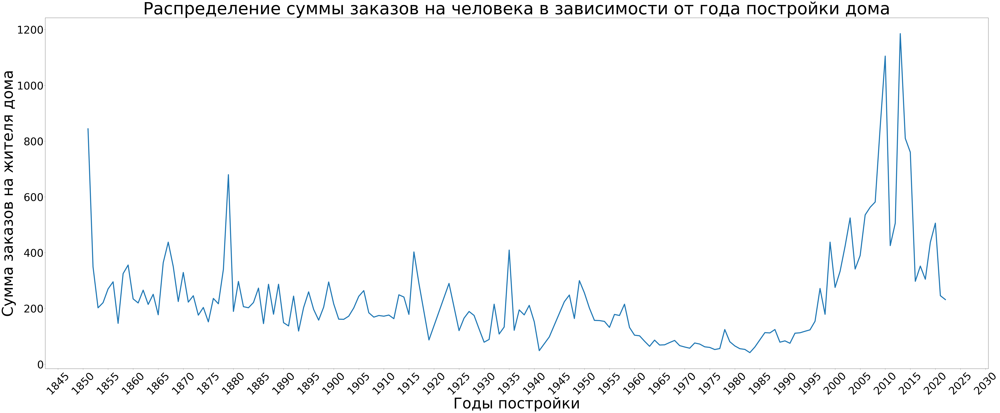

In [151]:
import matplotlib.ticker as ticker
plt.figure(figsize=(80, 30))

plt.plot(stat_by_year[(stat_by_year['year']>1850)&(stat_by_year['year']<2023)]['year'], stat_by_year[(stat_by_year['year']>1850)&(stat_by_year['year']<2023)]['rubles_per_person'], linewidth=5)
# stat_by_year['rubles_per_person'].plot(kind='line', linewidth=5)

# Добавление заголовков и подписей осей
plt.title('Распределение суммы заказов на человека в зависимости от года постройки дома', fontsize=80)
plt.xlabel('Годы постройки', fontsize=70)
plt.ylabel('Сумма заказов на жителя дома', fontsize=70)

# Вращение меток оси X
plt.gca().xaxis.set_major_locator(ticker.MultipleLocator(5))  # Устанавливаем частоту меток через каждый год
plt.xticks(rotation=45, fontsize=50)
plt.yticks(rotation=0, fontsize=50)


# Добавление вертикальной линии на 2019 год и подписи
# plt.axvline(x=2019, color='red', linewidth=3, linestyle='--')  # Вертикальная линия
# plt.text(2019, order_sum_per_person_by_year['rub_per_person'].max(), '2019', color='red', fontsize=50, ha='center', va='bottom')

plt.show()


In [145]:
stat_by_year[(stat_by_year['year']>1850)&(stat_by_year['year']<2024)]

,year,orders_per_person,rubles_per_person,count
64,1851,0.753446,843.984653,13
65,1852,0.276449,349.020916,30
66,1853,0.151343,202.230790,14
67,1854,0.176290,220.579021,15
68,1855,0.174183,269.954980,19
...,...,...,...,...
224,2019,0.266951,437.005032,155
225,2020,0.346000,505.691887,111
226,2021,0.188363,245.709183,77
227,2022,0.169004,231.614102,56


In [140]:
stat_by_year[stat_by_year['rubles_per_person']==stat_by_year['rubles_per_person'].max()]

,year,orders_per_person,rubles_per_person,count
13,1796,1.617647,3222.944412,1


Выгрузка графа

In [4]:
import osmnx as ox
from shapely.geometry import MultiPoint, Point


In [95]:
graph=ox.graph.graph_from_polygon(gpd.GeoDataFrame(index=[0], crs='epsg:32636', geometry=[MultiPoint(orders['geometry'].to_list()).convex_hull.buffer(200)]).to_crs('EPSG:4326')['geometry'][0], network_type="all")
graph = ox.utils_graph.get_undirected(graph)



C:\Temp\ipykernel_11716\1111962145.py:2: FutureWarning: The `get_undirected` function is deprecated and will be removed in the v2.0.0 release. Replace it with `convert.to_undirected` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  graph = ox.utils_graph.get_undirected(graph)


In [97]:
gdf_nodes, gdf_edges = ox.graph_to_gdfs(graph,
                                        nodes=True, #вернет геодатафрейм для нод
                                        edges=True, #вернет геодатафрейм для ребер
                                        node_geometry=True,
                                        fill_edge_geometry=True
                                       )

In [107]:
type(gdf_edges.reset_index()['geometry'][0])

shapely.geometry.linestring.LineString

In [113]:
for column in gdf_edges.columns:
    print(column, gdf_edges[column].dtype)

osmid object
highway object
oneway bool
reversed object
length float64
from int64
to int64
geometry geometry
lanes object
ref object
maxspeed object
bridge object
name object
width object
service object
access object
tunnel object
junction object
area object
est_width object
landuse object


In [123]:
type(gdf_edges.reset_index()['lanes'][2])

list

In [124]:
delimiter = ", "
result_string = delimiter.join([str(element) for element in gdf_edges.reset_index()['lanes'][2]])

In [134]:
gdf_e['lanes']

0                NaN
1                  4
2         4, 1, 2, 3
3                NaN
4                  3
             ...    
837837           NaN
837838           NaN
837839           NaN
837840           NaN
837841           NaN
Name: lanes, Length: 837842, dtype: object

In [129]:
gdf_e=gdf_edges.reset_index()
delimiter = ", "
for index, row in gdf_e.iterrows():
    for col in gdf_edges.columns:
        if type(row[col])==list:
            gdf_e.at[index, col]=delimiter.join([str(element) for element in gdf_e[col][index]])

In [130]:
gdf_e

,u,v,key,osmid,highway,oneway,reversed,length,from,to,...,bridge,name,width,service,access,tunnel,junction,area,est_width,landuse
0,354583,11740883387,0,62165465,service,False,False,75.190,11740883387,354583,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,354583,237939951,0,851742965,trunk,True,False,108.868,354583,237939951,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,354583,1143822963,0,"120953667, 55510535, 172426411, 45902931, 8517...",trunk,True,False,2155.973,1143822963,354583,...,yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,354584,237938571,0,22114863,secondary_link,True,False,490.850,354584,237938571,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,354584,354587,0,55510537,trunk,True,False,216.179,354584,354587,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
837837,12107052185,12107052186,0,1307353871,service,False,True,66.691,12107052186,12107052185,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
837838,12107052185,12107052190,0,1307353871,service,False,False,56.998,12107052190,12107052185,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
837839,12109106982,12109106983,0,1307594497,path,False,False,1264.470,12109106983,12109106982,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
837840,12114001176,12114001191,0,1308087257,track,False,True,252.035,12114001191,12114001176,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [131]:
gdf_e.to_file("SPb_graph_edges.gpkg")